In [230]:
from matplotlib.colors import LogNorm
import numpy as np
import pandas as pd
import seaborn as sns
import os
import glob
from datetime import datetime
from datetime import timedelta
from matplotlib import pyplot as plt
import matplotlib.dates as md
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import warnings
from matplotlib import cm
import matplotlib.dates as mdates
from scipy.interpolate import interp2d
warnings.filterwarnings('ignore')
#import datetime
import scipy.ndimage as ndimage
from matplotlib import cm
import geopy.distance
#import matplotlib as mpl
from scipy.interpolate import interp1d
from sklearn.linear_model import LinearRegression
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
import leafmap
import plotly.express as px
import matplotlib as mpl
import xarray as xr
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D
import math
import netCDF4
import xarray as xr

In [231]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Childrens_Park.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Childrens_Park.xlsx'
# Read the CSV file into a pandas DataFrame
Child_ParkT = pd.read_excel(csv_file_path)
Child_ParkTHCH = pd.read_excel(csv_file_pathHCH)
Child_ParkT
Child_ParkTHCH
#FNR = Child_ParkHCH/Child_Park
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,3.728688
1,2019-01-02,CH2O,13.089196
2,2019-01-03,CH2O,13.257077
3,2019-01-04,CH2O,1.431932
4,2019-01-07,CH2O,6.637563
...,...,...,...
906,2022-12-03,CH2O,4.837572
907,2022-12-10,CH2O,25.068345
908,2022-12-17,CH2O,4.367510
909,2022-12-24,CH2O,2.685768


In [233]:
# Step 1: Convert 'Date' column to datetime
Child_ParkT['Date'] = pd.to_datetime(Child_ParkT['Date'])
Child_ParkTHCH['Date'] = pd.to_datetime(Child_ParkTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
Child_ParkT['Year'] = Child_ParkT['Date'].dt.year
Child_ParkT['Month'] = Child_ParkT['Date'].dt.month

Child_ParkTHCH['Year'] = Child_ParkTHCH['Date'].dt.year
Child_ParkTHCH['Month'] = Child_ParkTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df, use_median=False):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='median' if use_median else 'mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='median' if use_median else 'mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='median' if use_median else 'mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_CP = process_data(Child_ParkT, use_median=True)  # NOx uses median
monthly_VOC_CP = process_data(Child_ParkTHCH, use_median=False)  # VOC uses mean

# Step 4: Compute FNR (VOC / NOx)
CP = monthly_VOC_CP[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_CP[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
CP['YearMonth'] = monthly_avg_CP['YearMonth']

# Reorder columns
CP = CP[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(CP)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  2.770667       1.965209       3.479970
1        2019-02  3.097481       2.269512       2.930029
2        2019-03  3.886765       4.019192       3.302452
3        2019-04  3.708247       2.780345       3.770108
4        2019-05  3.821810       2.870221       3.435746
5        2019-06  6.561982       3.867038       6.257307
6        2019-07  5.540359       4.306100       5.432492
7        2019-08  5.956751       5.042089       6.795505
8        2019-09  6.203101       3.745310       6.523790
9        2019-10  5.645035       2.585296       6.736240
10       2019-11  5.139108       2.924400       6.083793
11       2019-12  3.461965       2.857444       3.772246
12       2020-01  3.128321       1.775528       3.318147
13       2020-02  2.956096       1.195996       2.815566
14       2020-03  4.858458       2.842604       7.553570
15       2020-04  5.625882       1.877103       6.212561
16       2020-05  5.438737     

In [234]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Coach_Line.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Coach_Line.xlsx'
# Read the CSV file into a pandas DataFrame
Coach_LineT = pd.read_excel(csv_file_path)
Coach_LineTHCH = pd.read_excel(csv_file_pathHCH)
Coach_LineT
Coach_LineTHCH
#FNR = Coach_LineHCH/Coach_Line
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,3.492590
1,2019-01-02,CH2O,7.192760
2,2019-01-03,CH2O,7.452949
3,2019-01-04,CH2O,3.084302
4,2019-01-07,CH2O,7.198474
...,...,...,...
916,2022-12-03,CH2O,5.516699
917,2022-12-10,CH2O,16.283722
918,2022-12-17,CH2O,2.728163
919,2022-12-24,CH2O,17.389541


In [236]:
# Step 1: Convert 'Date' column to datetime
Coach_LineT['Date'] = pd.to_datetime(Coach_LineT['Date'])
Coach_LineTHCH['Date'] = pd.to_datetime(Coach_LineTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
Coach_LineT['Year'] = Coach_LineT['Date'].dt.year
Coach_LineT['Month'] = Coach_LineT['Date'].dt.month

Coach_LineTHCH['Year'] = Coach_LineTHCH['Date'].dt.year
Coach_LineTHCH['Month'] = Coach_LineTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_CL = process_data(Coach_LineT)
monthly_VOC_CL = process_data(Coach_LineTHCH)

# Step 4: Compute FNR (VOC / NOx)
CL = monthly_VOC_CL[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_CL[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
CL['YearMonth'] = monthly_avg_CL['YearMonth']

# Reorder columns
CL = CL[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(CL)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  1.795687       1.929868       1.641172
1        2019-02  2.189596       1.994760       1.997905
2        2019-03  3.036407       2.107983       2.903486
3        2019-04  3.162095       3.359501       3.059908
4        2019-05  4.291695       3.200114       4.630044
5        2019-06  6.000101       3.935070       7.020373
6        2019-07  5.501941       4.322840       6.414327
7        2019-08  4.674681       3.968338       5.269382
8        2019-09  4.511420       3.620735       4.922916
9        2019-10  4.016807       3.217958       4.282596
10       2019-11  4.870953       4.032408       4.668268
11       2019-12  2.933909       1.820871       2.762066
12       2020-01  1.949699       1.285902       2.344555
13       2020-02  3.181209       2.897944       3.938304
14       2020-03  2.932387       2.252801       3.130394
15       2020-04  4.448016       3.225915       4.888039
16       2020-05  4.812441     

In [237]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Craycroft.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Craycroft.xlsx'
# Read the CSV file into a pandas DataFrame
CraycroftT = pd.read_excel(csv_file_path)
CraycroftTHCH = pd.read_excel(csv_file_pathHCH)
CraycroftT
CraycroftTHCH
#FNR = CraycroftHCH/Craycroft
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,18.334421
1,2019-01-02,CH2O,10.606487
2,2019-01-03,CH2O,4.584255
3,2019-01-04,CH2O,18.447784
4,2019-01-07,CH2O,12.200878
...,...,...,...
903,2022-12-10,CH2O,5.042441
904,2022-12-17,CH2O,4.014656
905,2022-12-24,CH2O,7.071952
906,2022-12-31,CH2O,10.498026


In [239]:
# Step 1: Convert 'Date' column to datetime
CraycroftT['Date'] = pd.to_datetime(CraycroftT['Date'])
CraycroftTHCH['Date'] = pd.to_datetime(CraycroftTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
CraycroftT['Year'] = CraycroftT['Date'].dt.year
CraycroftT['Month'] = CraycroftT['Date'].dt.month

CraycroftTHCH['Year'] = CraycroftTHCH['Date'].dt.year
CraycroftTHCH['Month'] = CraycroftTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_CC = process_data(CraycroftT)
monthly_VOC_CC = process_data(CraycroftTHCH)

# Step 4: Compute FNR (VOC / NOx)
CC = monthly_VOC_CC[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_CC[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
CC['YearMonth'] = monthly_avg_CC['YearMonth']

# Reorder columns
CC = CC[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(CC)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  3.068933       2.344305       3.093972
1        2019-02  1.598101       1.010598       1.942821
2        2019-03  3.010405       2.862712       3.278853
3        2019-04  3.469366       2.960007       3.958056
4        2019-05  3.598735       3.014152       4.141840
5        2019-06  3.454132       3.437817       3.944572
6        2019-07  4.409223       5.072706       3.957952
7        2019-08  4.315735       3.523900       4.610209
8        2019-09  5.007551       4.976811       5.137497
9        2019-10  3.884073       3.390576       4.082339
10       2019-11  2.241517       1.522803       2.589053
11       2019-12  2.970473       2.357252       3.732558
12       2020-01  2.722957       1.896619       2.461987
13       2020-02  2.103864       1.319677       2.772186
14       2020-03  2.844366       2.565791       2.972922
15       2020-04  3.505393       2.491948       3.829075
16       2020-05  4.335620     

In [240]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Fairgrounds.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Fairgrounds.xlsx'
# Read the CSV file into a pandas DataFrame
FairgroundsT = pd.read_excel(csv_file_path)
FairgroundsTHCH = pd.read_excel(csv_file_pathHCH)
FairgroundsT
FairgroundsTHCH
#FNR = FairgroundsHCH/Fairgrounds
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,4.974144
1,2019-01-02,CH2O,7.491535
2,2019-01-03,CH2O,6.716981
3,2019-01-04,CH2O,6.227098
4,2019-01-07,CH2O,15.920955
...,...,...,...
887,2022-12-03,CH2O,20.206175
888,2022-12-10,CH2O,17.643910
889,2022-12-17,CH2O,3.771577
890,2022-12-24,CH2O,2.195413


In [242]:
# Step 1: Convert 'Date' column to datetime
FairgroundsT['Date'] = pd.to_datetime(FairgroundsT['Date'])
FairgroundsTHCH['Date'] = pd.to_datetime(FairgroundsTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
FairgroundsT['Year'] = FairgroundsT['Date'].dt.year
FairgroundsT['Month'] = FairgroundsT['Date'].dt.month

FairgroundsTHCH['Year'] = FairgroundsTHCH['Date'].dt.year
FairgroundsTHCH['Month'] = FairgroundsTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_FG = process_data(FairgroundsT)
monthly_VOC_FG = process_data(FairgroundsTHCH)

# Step 4: Compute FNR (VOC / NOx)
FG = monthly_VOC_FG[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_FG[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
FG['YearMonth'] = monthly_avg_FG['YearMonth']

# Reorder columns
FG = FG[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(FG)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  3.728904       4.884682       3.897970
1        2019-02  3.772223       3.257744       4.249684
2        2019-03  4.358624       3.699441       6.284459
3        2019-04  3.949276       3.683046       4.784242
4        2019-05  5.134956       3.020376       5.609853
5        2019-06  7.045623       6.465620       9.167531
6        2019-07  5.082880       4.593974       5.100251
7        2019-08  7.986773       7.086421       8.536435
8        2019-09  7.576800       6.111866       9.506548
9        2019-10  5.730739       4.456617       6.540789
10       2019-11  5.353676       3.456942       6.322349
11       2019-12  5.660553       4.891611       6.633577
12       2020-01  5.724545       4.166720       7.432190
13       2020-02  5.258590       3.058384       6.658917
14       2020-03  4.374259       2.398345       6.179673
15       2020-04  6.423597       3.593024       6.546992
16       2020-05  5.029594     

In [243]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Green_Valley.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Green_Valley.xlsx'
# Read the CSV file into a pandas DataFrame
Green_ValleyT = pd.read_excel(csv_file_path)
Green_ValleyTHCH = pd.read_excel(csv_file_pathHCH)
Green_ValleyT
Green_ValleyTHCH
#FNR = Green_ValleyHCH/Green_Valley
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,2.074517
1,2019-01-02,CH2O,6.368392
2,2019-01-03,CH2O,25.611693
3,2019-01-04,CH2O,7.654250
4,2019-01-07,CH2O,9.017810
...,...,...,...
873,2022-12-17,CH2O,2.467747
874,2022-12-24,CH2O,8.208934
875,2022-12-31,CH2O,16.896886
876,2023-01-07,CH2O,1.070492


In [245]:
# Step 1: Convert 'Date' column to datetime
Green_ValleyT['Date'] = pd.to_datetime(Green_ValleyT['Date'])
Green_ValleyTHCH['Date'] = pd.to_datetime(Green_ValleyTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
Green_ValleyT['Year'] = Green_ValleyT['Date'].dt.year
Green_ValleyT['Month'] = Green_ValleyT['Date'].dt.month

Green_ValleyTHCH['Year'] = Green_ValleyTHCH['Date'].dt.year
Green_ValleyTHCH['Month'] = Green_ValleyTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_GV = process_data(Green_ValleyT)
monthly_VOC_GV = process_data(Green_ValleyTHCH)

# Step 4: Compute FNR (VOC / NOx)
GV = monthly_VOC_GV[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_GV[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
GV['YearMonth'] = monthly_avg_GV['YearMonth']

# Reorder columns
GV = GV[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(GV)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  4.408344       2.720229       4.102557
1        2019-02  4.248689       3.101226       5.543345
2        2019-03  3.520807       2.678570       3.611079
3        2019-04  6.132542       2.497335      10.388619
4        2019-05  6.573813       2.822714       7.349927
5        2019-06  7.597021       4.176561      10.232927
6        2019-07  8.041221       4.989486       9.697620
7        2019-08  6.879539       6.698879       7.421039
8        2019-09  6.219083       3.698217       8.361638
9        2019-10  8.307917       3.433777      10.414371
10       2019-11  5.146824       3.885053       5.242211
11       2019-12  3.693380       2.601957       3.543877
12       2020-01  3.434286       2.118612       2.694425
13       2020-02  6.579744       3.923816       7.217972
14       2020-03  6.036596       5.780688       6.726606
15       2020-04  6.181738       3.820744       7.089133
16       2020-05  6.907806     

In [246]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Rose_Elementary.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Rose_Elementary.xlsx'
# Read the CSV file into a pandas DataFrame
Rose_ElementaryT = pd.read_excel(csv_file_path)
Rose_ElementaryTHCH = pd.read_excel(csv_file_pathHCH)
Rose_ElementaryT
Rose_ElementaryTHCH
#FNR = Rose_ElementaryHCH/Rose_Elementary
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,7.221050
1,2019-01-02,CH2O,8.826693
2,2019-01-03,CH2O,3.813478
3,2019-01-04,CH2O,15.074450
4,2019-01-07,CH2O,4.384533
...,...,...,...
920,2022-12-03,CH2O,9.152836
921,2022-12-10,CH2O,2.247149
922,2022-12-17,CH2O,4.888367
923,2022-12-24,CH2O,13.007822


In [248]:
# Step 1: Convert 'Date' column to datetime
Rose_ElementaryT['Date'] = pd.to_datetime(Rose_ElementaryT['Date'])
Rose_ElementaryTHCH['Date'] = pd.to_datetime(Rose_ElementaryTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
Rose_ElementaryT['Year'] = Rose_ElementaryT['Date'].dt.year
Rose_ElementaryT['Month'] = Rose_ElementaryT['Date'].dt.month

Rose_ElementaryTHCH['Year'] = Rose_ElementaryTHCH['Date'].dt.year
Rose_ElementaryTHCH['Month'] = Rose_ElementaryTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_RE = process_data(Rose_ElementaryT)
monthly_VOC_RE = process_data(Rose_ElementaryTHCH)

# Step 4: Compute FNR (VOC / NOx)
RE = monthly_VOC_RE[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_RE[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
RE['YearMonth'] = monthly_avg_RE['YearMonth']

# Reorder columns
RE = RE[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(RE)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  1.809822       1.723685       1.894865
1        2019-02  2.858626       2.919535       2.559420
2        2019-03  2.921146       1.797526       2.973758
3        2019-04  4.499326       5.296329       3.949358
4        2019-05  3.409186       2.556029       2.852138
5        2019-06  5.730391       3.070777       6.277365
6        2019-07  4.643696       3.733842       4.867192
7        2019-08  4.832501       5.285543       5.475797
8        2019-09  3.844668       2.882342       4.410158
9        2019-10  3.750701       2.721146       3.339337
10       2019-11  3.047956       2.066420       3.366674
11       2019-12  1.854069       1.807703       1.758706
12       2020-01  2.337271       1.874939       2.220760
13       2020-02  2.499732       2.332549       2.796032
14       2020-03  4.434463       3.648479       6.137332
15       2020-04  3.412153       2.378678       4.399413
16       2020-05  4.118641     

In [249]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Saguaro_Park.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Saguaro_Park.xlsx'
# Read the CSV file into a pandas DataFrame
Saguaro_ParkT = pd.read_excel(csv_file_path)
Saguaro_ParkTHCH = pd.read_excel(csv_file_pathHCH)
Saguaro_ParkT
Saguaro_ParkTHCH
#FNR = Saguaro_ParkHCH/Saguaro_Park
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,9.210186
1,2019-01-02,CH2O,8.897731
2,2019-01-03,CH2O,9.833905
3,2019-01-04,CH2O,16.257980
4,2019-01-07,CH2O,2.712931
...,...,...,...
830,2022-12-15,CH2O,19.968087
831,2022-12-16,CH2O,3.967678
832,2022-12-19,CH2O,3.303024
833,2022-12-03,CH2O,1.212677


In [251]:
# Step 1: Convert 'Date' column to datetime
Saguaro_ParkT['Date'] = pd.to_datetime(Saguaro_ParkT['Date'])
Saguaro_ParkTHCH['Date'] = pd.to_datetime(Saguaro_ParkTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
Saguaro_ParkT['Year'] = Saguaro_ParkT['Date'].dt.year
Saguaro_ParkT['Month'] = Saguaro_ParkT['Date'].dt.month

Saguaro_ParkTHCH['Year'] = Saguaro_ParkTHCH['Date'].dt.year
Saguaro_ParkTHCH['Month'] = Saguaro_ParkTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_SP = process_data(Saguaro_ParkT)
monthly_VOC_SP = process_data(Saguaro_ParkTHCH)

# Step 4: Compute FNR (VOC / NOx)
SP = monthly_VOC_SP[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_SP[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
SP['YearMonth'] = monthly_avg_SP['YearMonth']

# Reorder columns
SP = SP[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(SP)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  4.352160       2.993674       5.206031
1        2019-02  3.435013       2.771476       4.070168
2        2019-03  2.483070       2.588252       2.310963
3        2019-04  3.939433       1.976702       4.897548
4        2019-05  4.444419       3.374091       4.783797
5        2019-06  6.344558       5.438418       7.532559
6        2019-07  6.928157       4.479962       8.215567
7        2019-08  5.151712       4.896897       6.012405
8        2019-09  7.266129       5.488516       7.329828
9        2019-10  5.459998       3.955230       6.719596
10       2019-11  8.079237       5.566580       9.440861
11       2019-12  4.579445       3.476910       5.015439
12       2020-01  4.957518       2.163463       6.727293
13       2020-02  4.338308       3.317198       5.187619
14       2020-03  7.475988       5.628239       7.202326
15       2020-04  6.671925       4.265131       8.002234
16       2020-05  6.344586     

In [252]:
csv_file_path = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/NOx_Tropomi/Tangerine.xlsx'
csv_file_pathHCH = 'C:/Users/taiwoajayi/\OneDrive - University of Arizona/Arizona_ozone/HCHO_Tropomi/Tangerine.xlsx'
# Read the CSV file into a pandas DataFrame
TangerineT = pd.read_excel(csv_file_path)
TangerineTHCH = pd.read_excel(csv_file_pathHCH)
TangerineT
TangerineTHCH
#FNR = TangerineHCH/Tangerine
#FNR

,Date,Variable,Value
0,2019-01-01,CH2O,3.492590
1,2019-01-02,CH2O,7.192760
2,2019-01-03,CH2O,7.452949
3,2019-01-04,CH2O,3.084302
4,2019-01-07,CH2O,7.198474
...,...,...,...
916,2022-12-03,CH2O,5.516699
917,2022-12-10,CH2O,16.283722
918,2022-12-17,CH2O,2.728163
919,2022-12-24,CH2O,17.389541


In [254]:
# Step 1: Convert 'Date' column to datetime
TangerineT['Date'] = pd.to_datetime(TangerineT['Date'])
TangerineTHCH['Date'] = pd.to_datetime(TangerineTHCH['Date'])

# Step 2: Extract 'Year' and 'Month' for grouping
TangerineT['Year'] = TangerineT['Date'].dt.year
TangerineT['Month'] = TangerineT['Date'].dt.month

TangerineTHCH['Year'] = TangerineTHCH['Date'].dt.year
TangerineTHCH['Month'] = TangerineTHCH['Date'].dt.month

# Step 3: Group 2019, 2020 separately, and combine 2021-2022
def process_data(df):
    df_2019 = df[df['Year'] == 2019].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2019['YearMonth'] = df_2019['Month'].apply(lambda x: f"2019-{x:02d}")

    df_2020 = df[df['Year'] == 2020].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2020['YearMonth'] = df_2020['Month'].apply(lambda x: f"2020-{x:02d}")

    df_2021_2022 = df[df['Year'].between(2021, 2022)].groupby('Month')['Value'].agg(
        average='mean',
        percentile_25=lambda x: x.quantile(0.25),
        percentile_75=lambda x: x.quantile(0.75)
    ).reset_index()
    df_2021_2022['YearMonth'] = df_2021_2022['Month'].apply(lambda x: f"2021-2022-{x:02d}")

    return pd.concat([df_2019, df_2020, df_2021_2022], ignore_index=True)[['YearMonth', 'Month', 'average', 'percentile_25', 'percentile_75']]

# Process both datasets
monthly_avg_TG = process_data(TangerineT)
monthly_VOC_TG = process_data(TangerineTHCH)

# Step 4: Compute FNR (VOC / NOx)
TG = monthly_VOC_TG[['average', 'percentile_25', 'percentile_75']].div(
    monthly_avg_TG[['average', 'percentile_25', 'percentile_75']].values
)

# Re-add the 'YearMonth' column to the result DataFrame
TG['YearMonth'] = monthly_avg_TG['YearMonth']

# Reorder columns
TG = TG[['YearMonth', 'average', 'percentile_25', 'percentile_75']]

# Display the result
print(TG)


       YearMonth   average  percentile_25  percentile_75
0        2019-01  1.795687       1.929868       1.641172
1        2019-02  2.189596       1.994760       1.997905
2        2019-03  3.036407       2.107983       2.903486
3        2019-04  3.162095       3.359501       3.059908
4        2019-05  4.291695       3.200114       4.630044
5        2019-06  6.000101       3.935070       7.020373
6        2019-07  5.501941       4.322840       6.414327
7        2019-08  4.674681       3.968338       5.269382
8        2019-09  4.511420       3.620735       4.922916
9        2019-10  4.016807       3.217958       4.282596
10       2019-11  4.870953       4.032408       4.668268
11       2019-12  2.933909       1.820871       2.762066
12       2020-01  1.949699       1.285902       2.344555
13       2020-02  3.181209       2.897944       3.938304
14       2020-03  2.932387       2.252801       3.130394
15       2020-04  4.448016       3.225915       4.888039
16       2020-05  4.812441     

In [255]:
# Function to split a DataFrame into year chunks based on the 'YearMonth' column
def split_data_by_year(frame):
    # Convert 'YearMonth' to string format (handles both YYYY-MM and 2021-2022-MM formats)
    frame['YearMonth'] = frame['YearMonth'].astype(str)

    # Extract numeric years where applicable
    frame['Year'] = pd.to_datetime(frame['YearMonth'], errors='coerce').dt.year

    # Create masks for each year range
    mask_2021_2022 = frame['YearMonth'].str.startswith('2021-2022')  # Match '2021-2022'
    mask_2019 = frame['Year'] == 2019
    mask_2020 = frame['Year'] == 2020

    # Split the DataFrame based on the masks
    df_2019 = frame[mask_2019]
    df_2020 = frame[mask_2020]
    df_2021_2022 = frame[mask_2021_2022]  # Select rows where 'YearMonth' contains '2021-2022'

    return df_2019, df_2020, df_2021_2022


In [256]:
# List of DataFrames to split and calculate monthly averages
dataframes = {
    'CP': CP, 
    'CL': CL, 
    'TG': TG, 
    'CC': CC, 
    'FG': FG, 
    'SP': SP, 
    'RE': RE, 
    'GV': GV
}

splitted_data = {}

for name, df in dataframes.items():
    # Split the DataFrame into year chunks
    df_2019, df_2020, df_2021_2022 = split_data_by_year(df)

    # Assign correct keys, renaming "2021" to "2021-2022"
    year_keys = ['2019', '2020', '2021-2022']

    # Store the split DataFrames in the 'splitted_data' dictionary
    for df_year, key in zip([df_2019, df_2020, df_2021_2022], year_keys):
        splitted_data[f'{name}_{key}'] = df_year

        # Ensure 'YearMonth' is in datetime format for 2019 and 2020
        if key in ['2019', '2020']:
            df_year['YearMonth'] = pd.to_datetime(df_year['YearMonth'], errors='coerce', format='%Y-%m')
            df_year['Month'] = df_year['YearMonth'].dt.month  # Extract month

        # Handle 2021-2022 separately
        elif key == '2021-2022':
            df_year['YearMonth'] = df_year['YearMonth'].astype(str)  # Convert to string first
            df_year['Month'] = df_year['YearMonth'].str[-2:].astype(int)  # Extract last two digits as month
            df_year['YearMonth'] = df_year['Month'].apply(lambda x: f"2021-2022-{x:02d}")  # Format as 2021-2022-MM

# Example: Access the split DataFrame for CP in 2019 and 2021-2022
print(splitted_data['CP_2019'])  # Split data for CP in 2019
print(splitted_data['CP_2021-2022'])  # Split data for CP in 2021-2022


    YearMonth   average  percentile_25  percentile_75    Year  Month
0  2019-01-01  2.770667       1.965209       3.479970  2019.0      1
1  2019-02-01  3.097481       2.269512       2.930029  2019.0      2
2  2019-03-01  3.886765       4.019192       3.302452  2019.0      3
3  2019-04-01  3.708247       2.780345       3.770108  2019.0      4
4  2019-05-01  3.821810       2.870221       3.435746  2019.0      5
5  2019-06-01  6.561982       3.867038       6.257307  2019.0      6
6  2019-07-01  5.540359       4.306100       5.432492  2019.0      7
7  2019-08-01  5.956751       5.042089       6.795505  2019.0      8
8  2019-09-01  6.203101       3.745310       6.523790  2019.0      9
9  2019-10-01  5.645035       2.585296       6.736240  2019.0     10
10 2019-11-01  5.139108       2.924400       6.083793  2019.0     11
11 2019-12-01  3.461965       2.857444       3.772246  2019.0     12
       YearMonth   average  percentile_25  percentile_75  Year  Month
24  2021-2022-01  3.032581       

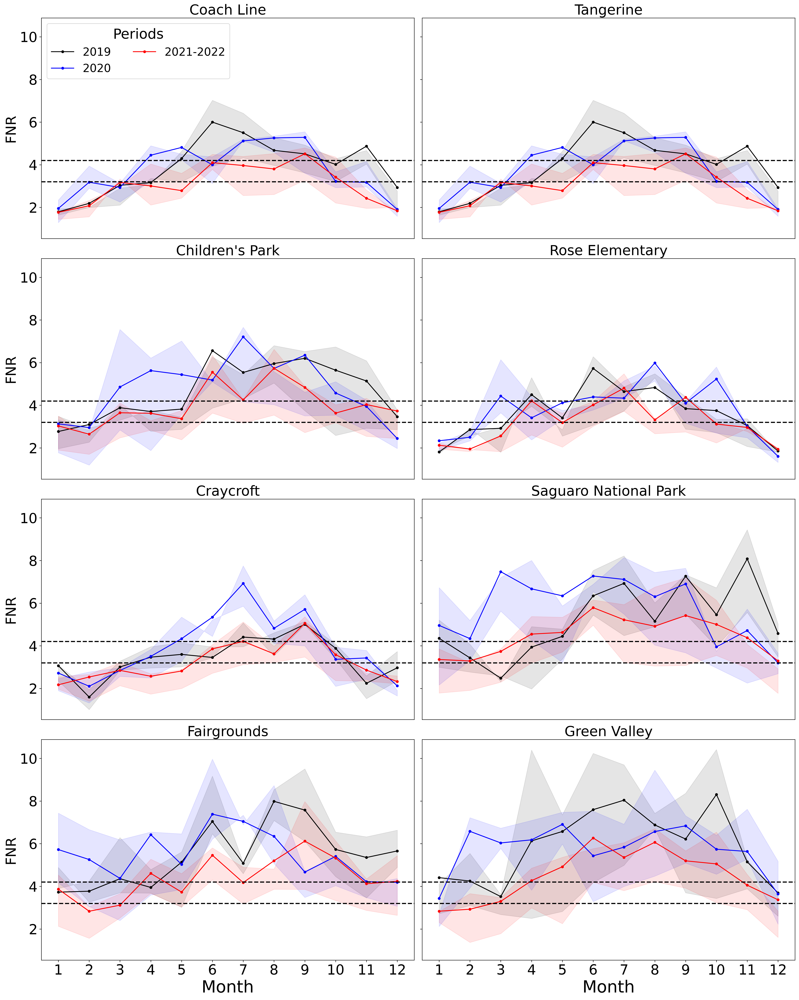

In [257]:
# Assuming monthly_avg_data is a dictionary containing the DataFrame for each period
fig, axs = plt.subplots(4, 2, figsize=(20, 25), sharey=True, dpi=300)  # Share Y axis across subplots

df_names = ['CL', 'TG', 'CP', 'RE', 'CC', 'SP', 'FG', 'GV']  # The 8 locations
titles = ['Coach Line', 'Tangerine', "Children's Park", 'Rose Elementary', 'Craycroft', 'Saguaro National Park', 'Fairgrounds', 'Green Valley']

for i, ax in enumerate(axs.flatten()):
    name = df_names[i]

    # Extract data for different time periods
    periods = [
        ('2019', f'{name}_2019', 'k'),
        ('2020', f'{name}_2020', 'blue'),
        ('2021-2022', f'{name}_2021-2022', 'red')  # Correct key for 2021-2022
    ]
    
    for period, key, color in periods:
        if key in splitted_data:  # Ensure the key exists before accessing it
            df_period = splitted_data[key]
            ax.plot(df_period['Month'], df_period['average'], label=period, color=color, marker='o', markersize=4)  # Specify color
            ax.fill_between(df_period['Month'], df_period['percentile_25'], df_period['percentile_75'], alpha=0.1, color=color)

    # Add horizontal dashed lines at y=3.2 and y=4.2
    ax.axhline(y=3.2, color='k', linestyle='--', linewidth=2, alpha=1)
    ax.axhline(y=4.2, color='k', linestyle='--', linewidth=2, alpha=1)

    if i % 2 == 0:  # Left column subplots
        ax.set_ylabel('FNR', fontsize=25)
        ax.tick_params(axis='y', labelsize=25)

    if i >= 6:  # Last row
        ax.set_xlabel('Month', fontsize=30)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(range(1, 13), fontsize=25)  # Label x-ticks with numbers
    else:
        ax.set_xticks([])  # No x-tick labels for non-last rows

    ax.set_title(titles[i], fontsize=25)

    if i == 0:
        ax.legend(title='Periods', ncol=2, fontsize=20, title_fontsize=25, loc='upper left')

plt.tight_layout()
plt.show()


In [258]:
monthly_VOC_GV

,YearMonth,Month,average,percentile_25,percentile_75
0,2019-01,1,8.266395,3.923806,9.610928
1,2019-02,2,7.221028,3.833703,10.120269
2,2019-03,3,6.071300,3.269668,7.628320
3,2019-04,4,7.593382,2.800015,13.528187
4,2019-05,5,9.125407,3.255321,12.153398
5,2019-06,6,9.816791,4.737784,13.396643
6,2019-07,7,12.849622,7.284502,17.104283
7,2019-08,8,11.153412,7.993171,13.578621
8,2019-09,9,8.980460,4.981207,13.023549
9,2019-10,10,12.213355,3.767500,16.631748


In [259]:
# Dictionary containing DataFrames
dataframes = {
    'CP': monthly_VOC_CP, 
    'CL': monthly_VOC_CL, 
    'TG': monthly_VOC_TG, 
    'CC': monthly_VOC_CC, 
    'FG': monthly_VOC_FG, 
    'SP': monthly_VOC_SP, 
    'RE': monthly_VOC_RE, 
    'GV': monthly_VOC_GV
}

splitted_VOC = {}

for name, df in dataframes.items():
    # Split the DataFrame into year chunks
    df_2019, df_2020, df_2021_2022 = split_data_by_year(df)

    # Assign correct keys, renaming "2021" to "2021-2022"
    year_keys = ['2019', '2020', '2021-2022']

    # Store the split DataFrames in the 'splitted_VOC' dictionary
    for df_year, key in zip([df_2019, df_2020, df_2021_2022], year_keys):
        splitted_VOC[f'{name}_{key}'] = df_year

        # Ensure 'YearMonth' is properly converted for 2019 and 2020
        if key in ['2019', '2020']:
            df_year['YearMonth'] = df_year['YearMonth'].astype(str)  # Convert to string before datetime conversion
            df_year['YearMonth'] = pd.to_datetime(df_year['YearMonth'], errors='coerce', format='%Y-%m')
            df_year['Year'] = df_year['YearMonth'].dt.year  # Extract year correctly
            df_year['Month'] = df_year['YearMonth'].dt.month  # Extract month correctly

        # Handle 2021-2022 separately
        elif key == '2021-2022':
            df_year['Month'] = df_year['YearMonth'].str[-2:].astype(int)  # Extract last two digits as month
            df_year['YearMonth'] = df_year['Month'].apply(lambda x: f"2021-2022-{x:02d}")  # Format as 2021-2022-MM
            df_year['Year'] = 2021  # Assign Year manually

# Example: Access the split DataFrame for CP in 2019 and 2021-2022
print(splitted_VOC['CP_2019'])  # Split data for CP in 2019
print(splitted_VOC['CP_2021-2022'])  # Split data for CP in 2021-2022


    YearMonth  Month    average  percentile_25  percentile_75  Year
0  2019-01-01      1   7.062731       3.684532      10.807105  2019
1  2019-02-01      2   6.263483       3.751055       8.117119  2019
2  2019-03-01      3   8.388555       5.369510       8.821912  2019
3  2019-04-01      4   5.824272       3.516500       7.617236  2019
4  2019-05-01      5   6.014091       3.953680       6.950098  2019
5  2019-06-01      6   9.716773       5.115592      12.041046  2019
6  2019-07-01      7  10.424457       7.122085      14.077956  2019
7  2019-08-01      8  10.778298       7.122396      13.723002  2019
8  2019-09-01      9  10.925966       5.047312      15.176881  2019
9  2019-10-01     10   9.736311       3.878294      13.999745  2019
10 2019-11-01     11   9.797735       4.791863      13.167652  2019
11 2019-12-01     12   8.329995       5.561630      10.967775  2019
       YearMonth  Month   average  percentile_25  percentile_75  Year
24  2021-2022-01      1  7.660577       3.7692

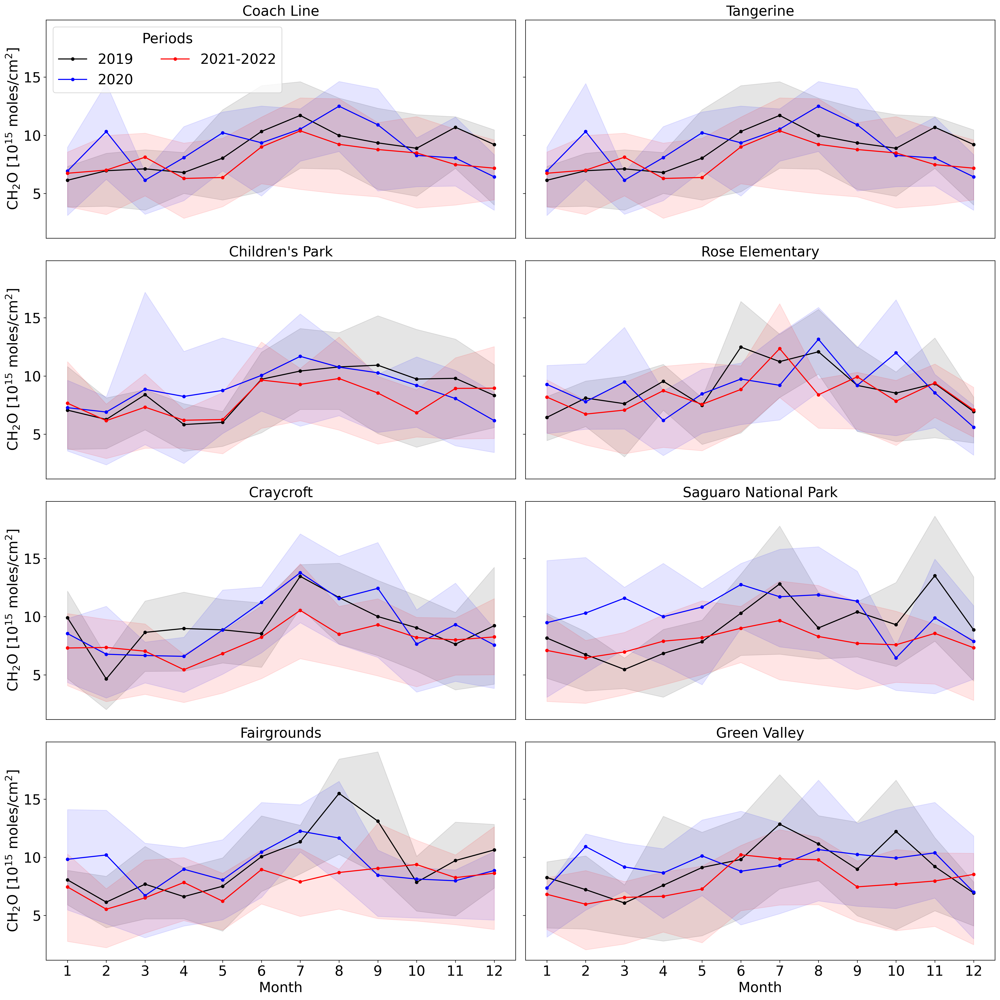

In [262]:
# Assuming monthly_avg_data is a dictionary containing the DataFrame for each period
fig, axs = plt.subplots(4, 2, figsize=(20, 20), sharey=True, dpi=300)  # Share Y axis across subplots

df_names = ['CL', 'TG', 'CP', 'RE', 'CC', 'SP', 'FG', 'GV']  # The 8 locations
titles = ['Coach Line', 'Tangerine', 'Children\'s Park', 'Rose Elementary', 'Craycroft', 'Saguaro National Park', 'Fairgrounds', 'Green Valley']

for i, ax in enumerate(axs.flatten()):
    name = df_names[i]

    # Extract data for different time periods
    periods = [
        ('2019', f'{name}_2019', 'k'),
        ('2020', f'{name}_2020', 'blue'),  # Magenta color for 2005-2010
        ('2021-2022', f'{name}_2021-2022', 'red')   # Keeping existing color for 2011-2016
        #,('2022', f'{name}_2022', 'c')      # Keeping existing color for 2017-2022
    ]
    
    for period, key, color in periods:
        df_period = splitted_VOC[key]
        ax.plot(df_period['Month'], df_period['average'], label=period, color=color, marker = 'o', markersize=4)  # Specify color
        ax.fill_between(df_period['Month'], df_period['percentile_25'], df_period['percentile_75'], alpha=0.1, color=color)  # Match fill color


    # Add horizontal dashed lines at y=3.2 and y=4.2

    if i % 2 == 0:
        ax.set_ylabel('CH$_2$O [$10^{15}$ moles/cm$^2$]', fontsize=20)
        ax.tick_params(axis='y', labelsize=20)
        

    if i >= 6:  # Last row
        ax.set_xlabel('Month', fontsize=20)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(range(1, 13), fontsize=20)  # Label x-ticks with numbers
    else:
        ax.set_xticks([])  # No x-tick labels for non-last rows
    #ax.set_xlim(1, 12.5)

    ax.set_title(titles[i], fontsize=20)

    if i == 0:
        ax.legend(title='Periods', ncol=2, fontsize=20, title_fontsize=20, loc='upper left')

plt.tight_layout()
plt.show()


In [261]:
# Dictionary containing DataFrames
dataframes = {
    'CP': monthly_avg_CP, 
    'CL': monthly_avg_CL, 
    'TG': monthly_avg_TG, 
    'CC': monthly_avg_CC, 
    'FG': monthly_avg_FG, 
    'SP': monthly_avg_SP, 
    'RE': monthly_avg_RE, 
    'GV': monthly_avg_GV
}

splitted_NO = {}

for name, df in dataframes.items():
    # Split the DataFrame into year chunks
    df_2019, df_2020, df_2021_2022 = split_data_by_year(df)

    # Assign correct keys, renaming "2021" to "2021-2022"
    year_keys = ['2019', '2020', '2021-2022']

    # Store the split DataFrames in the 'splitted_NO' dictionary
    for df_year, key in zip([df_2019, df_2020, df_2021_2022], year_keys):
        splitted_NO[f'{name}_{key}'] = df_year

        # Ensure 'YearMonth' is properly converted for 2019 and 2020
        if key in ['2019', '2020']:
            df_year['YearMonth'] = df_year['YearMonth'].astype(str).str.strip()  # Convert to string before datetime conversion
            df_year['YearMonth'] = pd.to_datetime(df_year['YearMonth'], errors='coerce', format='%Y-%m')

            # Extract year & month only if YearMonth conversion was successful
            valid_dates = df_year['YearMonth'].notna()
            df_year.loc[valid_dates, 'Year'] = df_year.loc[valid_dates, 'YearMonth'].dt.year
            df_year.loc[valid_dates, 'Month'] = df_year.loc[valid_dates, 'YearMonth'].dt.month

        # Handle 2021-2022 separately
        elif key == '2021-2022':
            df_year['Month'] = df_year['YearMonth'].str[-2:].astype(int)  # Extract last two digits as month
            df_year['YearMonth'] = df_year['Month'].apply(lambda x: f"2021-2022-{x:02d}")  # Format as 2021-2022-MM
            df_year['Year'] = 2021  # Assign Year manually

# Example: Access the split DataFrame for CP in 2019 and 2021-2022
print(splitted_NO['CP_2019'])  # Split data for CP in 2019
print(splitted_NO['CP_2021-2022'])  # Split data for CP in 2021-2022


    YearMonth  Month   average  percentile_25  percentile_75    Year
0  2019-01-01      1  2.549109       1.874880       3.105517  2019.0
1  2019-02-01      2  2.022121       1.652802       2.770320  2019.0
2  2019-03-01      3  2.158236       1.335968       2.671322  2019.0
3  2019-04-01      4  1.570627       1.264771       2.020429  2019.0
4  2019-05-01      5  1.573624       1.377483       2.022879  2019.0
5  2019-06-01      6  1.480768       1.322871       1.924318  2019.0
6  2019-07-01      7  1.881549       1.653953       2.591436  2019.0
7  2019-08-01      8  1.809426       1.412588       2.019423  2019.0
8  2019-09-01      9  1.761372       1.347635       2.326390  2019.0
9  2019-10-01     10  1.724756       1.500135       2.078273  2019.0
10 2019-11-01     11  1.906505       1.638580       2.164382  2019.0
11 2019-12-01     12  2.406147       1.946365       2.907492  2019.0
       YearMonth  Month   average  percentile_25  percentile_75  Year
24  2021-2022-01      1  2.526091

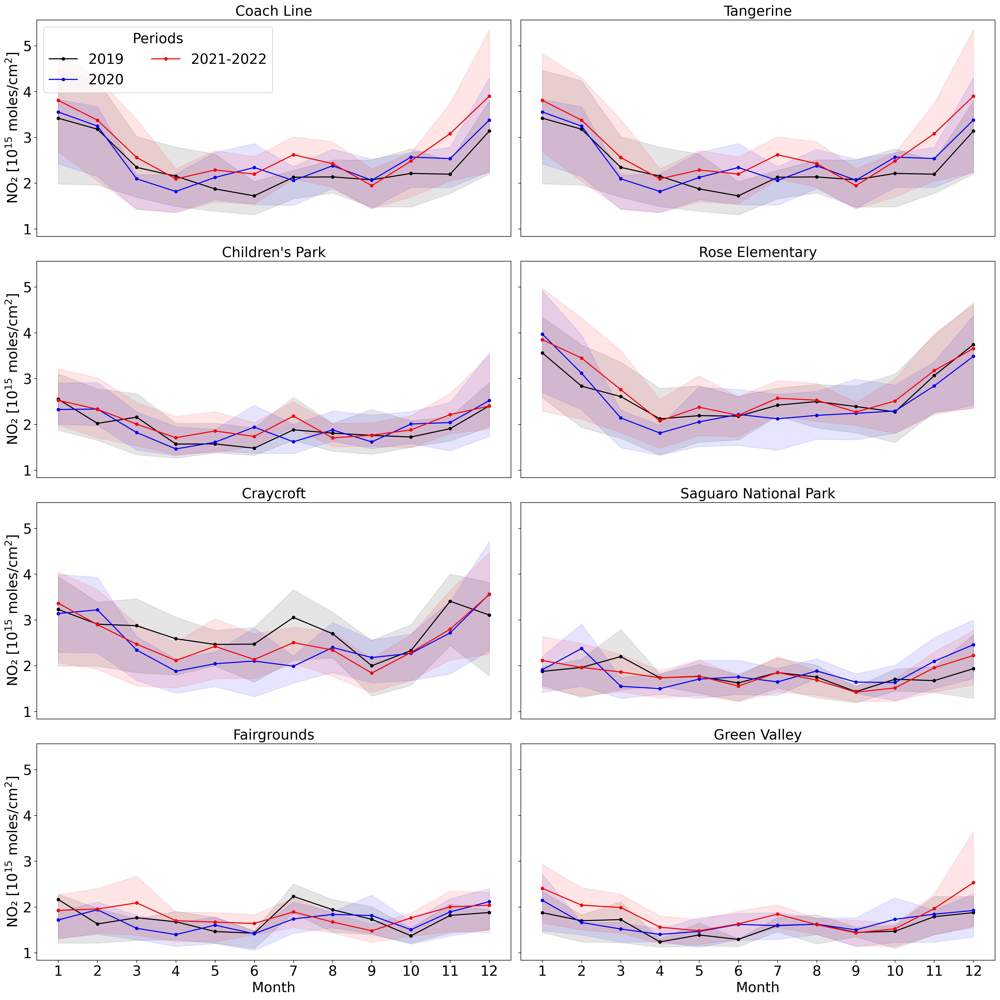

In [263]:
# Assuming monthly_avg_data is a dictionary containing the DataFrame for each period
fig, axs = plt.subplots(4, 2, figsize=(20, 20), sharey=True, dpi=300)  # Share Y axis across subplots

df_names = ['CL', 'TG', 'CP', 'RE', 'CC', 'SP', 'FG', 'GV']  # The 8 locations
titles = ['Coach Line', 'Tangerine', 'Children\'s Park', 'Rose Elementary', 'Craycroft', 'Saguaro National Park', 'Fairgrounds', 'Green Valley']

for i, ax in enumerate(axs.flatten()):
    name = df_names[i]

    # Extract data for different time periods
    periods = [
        ('2019', f'{name}_2019', 'k'),
        ('2020', f'{name}_2020', 'blue'),  # Magenta color for 2005-2010
        ('2021-2022', f'{name}_2021-2022', 'red')   # Keeping existing color for 2011-2016
        #,('2022', f'{name}_2022', 'c')      # Keeping existing color for 2017-2022
    ]
    
    for period, key, color in periods:
        df_period = splitted_NO[key]
        ax.plot(df_period['Month'], df_period['average'], label=period, color=color, marker = 'o', markersize=4)  # Specify color
        ax.fill_between(df_period['Month'], df_period['percentile_25'], df_period['percentile_75'], alpha=0.1, color=color)  # Match fill color


    # Add horizontal dashed lines at y=3.2 and y=4.2
    if i % 2 == 0:
        ax.set_ylabel('NO\u2082 [$10^{15}$ moles/cm$^2$]', fontsize=20)
        ax.tick_params(axis='y', labelsize=20)

    if i >= 6:  # Last row
        ax.set_xlabel('Month', fontsize=20)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(range(1, 13), fontsize=20)  # Label x-ticks with numbers
    else:
        ax.set_xticks([])  # No x-tick labels for non-last rows

        
    ax.set_title(titles[i], fontsize=20)

    if i == 0:
        ax.legend(title='Periods', ncol=2, fontsize=20, title_fontsize=20, loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
# Load the shapefile for background mapping
'''shapefile_path = "C:/Users/taiwoajayi/OneDrive - University of Arizona/Arizona_ozone/Ozone/tl_2023_04019_roads.shp"
gdf_pima = gpd.read_file(shapefile_path)'''
